# Modelling `averageprice`

In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import median_absolute_error
from collections import deque #deques are much faster to append to than lists
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.pyplot import figure
%matplotlib inline

In [2]:
#import data
train = pd.read_csv('train.csv', index_col='date', parse_dates=True)
validation = pd.read_csv('validation.csv', index_col='date', parse_dates=True)
test = pd.read_csv('test.csv', index_col='date', parse_dates=True)

Note the following changes in these datasets, from the original data:
- the sales and google search term data have been joined using `date` as the join key
- NULLs have been filled via forward fill (Pandas `fillna(method='ffill')`)
- `season` has been added as an x-var
- all headers are in readable, code-friendly format (lower case and stripped for whitespace)

This processing was done during the exploratory analysis.

#### Important:
There is a **unique key** for this dataset: **[date, region, type]**.

#### Note on train/validation/test split
Since this is time series data, we want full years (with all their seasonal variations) to exist in the train, validation, and test set. Therefore, the validation and test set will each be 12 sequential months, and the training set will be the roughly 2.5 years left over (2015 through mid-2017)

In [3]:
print('training set:\n\t{} to {}'.format(train.index.min(), train.index.max()))
print('validation set:\n\t{} to {}'.format(validation.index.min(), validation.index.max()))
print('test set:\n\t{} to {}'.format(test.index.min(), test.index.max()))

training set:
	2015-01-04 00:00:00 to 2017-06-25 00:00:00
validation set:
	2017-08-06 00:00:00 to 2018-06-24 00:00:00
test set:
	2018-08-05 00:00:00 to 2019-06-30 00:00:00


In [4]:
total = train.shape[0] + validation.shape[0] + test.shape[0]
print('training:\n\t{}%'.format(round(100*(train.shape[0] / total))))
print('validation:\n\t{}%'.format(round(100*(validation.shape[0] / total))))
print('test:\n\t{}%'.format(round(100*(test.shape[0] / total))))

training:
	58%
validation:
	21%
test:
	21%


## Preprocess data

Since this is a forecasting problem, we will not have all x-variables for time t when we forecast. Therefore, we will forecast one week ahead (time t) using some x-variables from the current week (time t-1). This requires us to shift the x-variables one week behind, which must be done carefully so that the unique key [date, region, type] stays in tact after the time shift.

Time shifting allows us to use x variables at t-1 (this week) to predict the y variable at time t (next week):
<img src="https://i.imgur.com/QzuX3Sp.png" width="400">

In [5]:
def add_median_averageprice_quantile(df, first, second, third, fourth):
    '''
    Adds a column for the quantile of the median averageprice per region.
    '''
    df['median_averageprice_quantile'] = [int(1) if region in first else \
                                          int(2) if region in second else \
                                          int(3) if region in third else \
                                          int(4) if region in fourth else \
                                          int(0) for region in df.region]
    return df

In [6]:
#look at rows in df that contain NULLs
def view_nulls(df):
    print(df[df.isnull().any(axis=1)].head())

In [99]:
def averageprice_processing(df, first, second, third, fourth, train=True, scaler=None, to_scale=True):
    '''
    Prepares data for modelling averageprice.
    - Shifts predictors back one week in time
    - Checks to ensure shift worked via an expected observation count
    - Z-score normalizes numeric variables (except averageprice)
    - If train=True, z-scaler is fit and returned to be used on validation and test set
    - Creates predictor: median_averageprice_quantile
    - splits x and y
    
    Note: many variables are hard-coded for speed of coding. When more time is available this code
    can be moved to library script and put into class format.
    '''
    #define columns of interest, in order from floats to non-floats (to make separation easier)
    df_cols = ['averageprice', 
               'totalvolume', 
               'totalbags',
               'gst_avocado_recipe',
               'median_averageprice_quantile',
               'type',
               'season',
               'region'] #region is only there for a join key, will be dropped before modelling
    #define data to be scaled
    cols_to_scale = ['totalvolume', 
                     'totalbags',
                     'gst_avocado_recipe']
    #define data NOT to be scaled
    cols_not_to_scale = ['averageprice_y', #we want to leave averageprice on its original scale
                         'averageprice',
                         'median_averageprice_quantile',
                         'type',
                         'season']      
    
    
    #record original counts to ensure quality of processing
    orig_shape = df.shape
    n_dates = len(pd.date_range(start=df.index.min(), end=df.index.max(), freq='7D'))
    n_regions = len(set(df['region']))
    n_types = len(set(df['type']))
   
    
    #add column: median_averageprice_quantile
    df = add_median_averageprice_quantile(df, first, second, third, fourth)
    
    #grab only relevant columns
    df = df.loc[:, df_cols].copy()
    
    #grab y 
    y_df = df.loc[:, ['averageprice', 'region', 'type']].copy()
    y_df.columns = ['averageprice_y', 'region', 'type']
    
    
    ####
    #time shifting
    #shift all x variables back one week t-1 (drop latest date, add 7 days to each date), 
    #so we can make predictions 1 week into the future)
    ###
    #drop the latest date in x since it doesn't have an associated future y (t+1)
    df = df.drop(axis=0, index=df.index.max(), inplace=False)
    
    #drop the earliest date in y since it doesn't have a corresponding past x (t-1) 
    y_df = y_df.drop(axis=0, index=y_df.index.min(), inplace=False)
    
    #add 7 days to each date in x so that we can join the x (t-1) and y (t) dfs on the unique key [date, region, type]
    df.index = df.index + pd.Timedelta(days=7)
    
    #join x and y on the unique key [date, region, type]
    df = y_df.merge(df, how='outer', on=['date', 'region', 'type']) #'outer': similar to a SQL full outer join
    
    #save regions
    regions_data = df.region
    
    #save types
    types_data = df.type
    
    #drop region since we won't use it for the modelling
    df = df.drop(labels='region', axis=1, inplace=False)
    
    #save datetime index so we can use it in the final analysis
    datetime_index = df.index
    

    ####
    #separate data we want scaled and not_scaled
    ####
    #grab columns of we want to scale
    floats_df = df.loc[:, cols_to_scale].copy()
    #save column names
    floats_cols = floats_df.columns

    #grab columns we don't want to scale
    no_scaling_df = df.loc[:, cols_not_to_scale].copy()
        
    
    ####
    #create dummies for categorical data
    ####
    #this gets dummies for 'type'; 'median_averageprice_quantile' and 'season' are encoded as int because they are ordinal
    no_scaling_df = pd.get_dummies(no_scaling_df) 
    #drop 'type_organic' since 'type' is binary and can be encapsulated with only 'type_conventional' (0 or 1)
    no_scaling_df = no_scaling_df.drop(labels='type_organic', axis=1, inplace=False)
    #save column names
    no_scaling_cols = no_scaling_df.columns
    
    
    #create numpy arrays
    floats_arr = np.array(floats_df)
    no_scaling_arr = np.array(no_scaling_df)
    
    
    ####
    #normalize numeric data
    ####
    #if this is the training set, fit a scaler to it
    if train:
        z_scaler = StandardScaler()
        z_scaler.fit(floats_arr)
        scaled_floats_arr = z_scaler.transform(floats_arr)
    #else use the scaler passed in
    else:
        scaled_floats_arr = scaler.transform(floats_arr)
     
        
    ####
    #separate x and y
    ####
    #grab y (we know it is the first column in no_scaling_arr)
    y = np.take(no_scaling_arr, [0], axis=1) 
    
    #drop y from x
    no_scaling_arr = no_scaling_arr[:, 1:]
    
    #put numeric data and non-numeric data back together
    x = np.concatenate((scaled_floats_arr, no_scaling_arr), axis=1)
    

    #create an x_df so we can get an idea of what our training data looks like
    x_df = pd.DataFrame(x, 
                        columns=list(floats_cols) + list(no_scaling_cols[1:]) #skip the first col name, averageprice_y
                       )  
    #add key identifiers to x_df
    x_df['date'] = np.array(datetime_index)
    x_df['region'] = np.array(regions_data)
    x_df['type'] = np.array(types_data)
    #set a multi-index
    x_df.set_index(['date', 'region', 'type'],inplace=True)
    
    
    ####
    #print results
    ####
    print('------------------------------')
    print('Original shape of data:\n\t{}'.format(orig_shape))
    print('-------')
    #x should be missing only one date (due to shifting) for each region/type combination:
    total_combinations = n_dates * n_regions * n_types
    x_should = total_combinations - (n_regions * n_types)
    print('x *should* have \n\t{} records.\nx *has*\n\t{} records\nDifference:\n\t{} records <----------------'\
          .format(x_should, x.shape[0], x_should - x.shape[0]))    
    print('-------')
    print('Shape of x:\n\t{}'.format(x.shape))
    print('Shape of x_df:\n\t{}'.format(x_df.shape))
    print('Shape of y:\n\t{}'.format(y.shape))
    print('Length of datetime_index:\n\t{}'.format(len(datetime_index)))
    print('------------------------------\n\n')
    
    
    #if train, return the fitted scaler
    if train:
        return z_scaler, x, x_df, y, datetime_index
    #else, no scaler was fitted
    else:
        return x, x_df, y, datetime_index

In [8]:
#import lists (quantiles are based on training set)
first = list(pd.read_csv('averageprice_list_0.csv', header=None).iloc[0,:])
second = list(pd.read_csv('averageprice_list_1.csv', header=None).iloc[0,:])
third = list(pd.read_csv('averageprice_list_2.csv', header=None).iloc[0,:])
fourth = list(pd.read_csv('averageprice_list_3.csv', header=None).iloc[0,:])

In [100]:
#call fcn
print('Training set:')
z_scaler, x_train, x_train_df, y_train, train_datetime_index = averageprice_processing(
    train, first, second, third, fourth, 
    train=True, 
    scaler=None)

print('Validation set:')
x_validation, x_validation_df, y_validation, validation_datetime_index = averageprice_processing(
    validation, first, second, third, fourth, 
    train=False, 
    scaler=z_scaler)

print('Test set:')
x_test, x_test_df, y_test, test_datetime_index = averageprice_processing(
    test, first, second, third, fourth, 
    train=False, 
    scaler=z_scaler)

Training set:
------------------------------
Original shape of data:
	(14040, 20)
-------
x *should* have 
	13932 records.
x *has*
	13932 records
Difference:
	0 records <----------------
-------
Shape of x:
	(13932, 7)
Shape of x_df:
	(13932, 7)
Shape of y:
	(13932, 1)
Length of datetime_index:
	13932
------------------------------


Validation set:
------------------------------
Original shape of data:
	(5076, 20)
-------
x *should* have 
	4968 records.
x *has*
	4968 records
Difference:
	0 records <----------------
-------
Shape of x:
	(4968, 7)
Shape of x_df:
	(4968, 7)
Shape of y:
	(4968, 1)
Length of datetime_index:
	4968
------------------------------


Test set:
------------------------------
Original shape of data:
	(5184, 20)
-------
x *should* have 
	5076 records.
x *has*
	5076 records
Difference:
	0 records <----------------
-------
Shape of x:
	(5076, 7)
Shape of x_df:
	(5076, 7)
Shape of y:
	(5076, 1)
Length of datetime_index:
	5076
------------------------------




### Check out training data
Make sure everything looks as expected.

In [10]:
x_train_df.head()

totalvolume  totalbags  \
date       region              type                                   
2015-01-11 Albany              conventional    -0.234416  -0.230890   
                               organic         -0.245915  -0.240140   
           Atlanta             conventional    -0.119668  -0.190770   
                               organic         -0.245195  -0.239874   
           BaltimoreWashington conventional    -0.016899  -0.088772   

                                             gst_avocado_recipe  averageprice  \
date       region              type                                             
2015-01-11 Albany              conventional            1.228247          1.22   
                               organic                 1.228247          1.79   
           Atlanta             conventional            1.228247          1.00   
                               organic                 1.228247          1.76   
           BaltimoreWashington conventional            1.228247          1.23   

                                             median_averageprice_quantile  \
date       region              type                                         
2015-01-11 Albany              conventional                           4.0   
                               organic                                4.0   
           Atlanta             conventional                           2.0   
                               organic                                2.0   
           BaltimoreWashington conventional                           4.0   

                                             season  type_conventional  
date       region              type                                     
2015-01-11 Albany              conventional     1.0                1.0  
                               organic          1.0                0.0  
           Atlanta             conventional     1.0                1.0  
                               organic          1.0                0.0  
           BaltimoreWashington conventional     1.0                1.0

In [11]:
y_train[:5]

array([[1.24],
       [1.77],
       [1.11],
       [1.84],
       [1.23]])

In [12]:
x_train_df.describe()

,totalvolume,totalbags,gst_avocado_recipe,averageprice,median_averageprice_quantile,season,type_conventional
count,1.393200e+04,1.393200e+04,1.393200e+04,13932.000000,13932.000000,13932.000000,13932.000000
mean,6.395018e-19,1.608736e-16,-9.127961e-15,1.366094,2.518519,2.364556,0.500000
std,1.000036e+00,1.000036e+00,1.000036e+00,0.397078,1.134366,1.077948,0.500018
min,-2.462906e-01,-2.413970e-01,-2.164049e+00,0.440000,1.000000,1.000000,0.000000
25%,-2.435006e-01,-2.375394e-01,-8.337367e-01,1.060000,1.000000,1.000000,0.000000
50%,-2.165314e-01,-2.022613e-01,9.748174e-02,1.320000,3.000000,2.000000,0.500000
75%,-1.205503e-01,-1.312080e-01,6.961222e-01,1.630000,4.000000,3.000000,1.000000
max,1.752257e+01,1.738359e+01,2.159465e+00,3.250000,4.000000,4.000000,1.000000


`gst_avocado_recipe` should have a mean of zero, but it looks like it didn't scale well (mean = 1.4)

In [13]:
set(x_train_df.median_averageprice_quantile)

{1.0, 2.0, 3.0, 4.0}

In [14]:
set(x_train_df.season)

{1.0, 2.0, 3.0, 4.0}

In [15]:
set(x_train_df.type_conventional)

{0.0, 1.0}

### Check for nan and inf values
These will mess up our model training.

In [16]:
def find_nan_inf(arr, arr_name):
    print('-------', arr_name, '-------')
    print('nan\n\t',len(np.where(np.isnan(arr))[0]))
    print('inf\n\t',len(np.where(np.isinf(arr))[0]))
    print('-inf\n\t',len(np.where(np.isneginf(arr))[0]))

In [17]:
find_nan_inf(x_train, 'x_train')
find_nan_inf(y_train, 'y_train')
find_nan_inf(x_validation, 'x_validation')
find_nan_inf(y_validation, 'y_validation')
find_nan_inf(x_test, 'x_test')
find_nan_inf(y_test, 'y_test')

------- x_train -------
nan
	 0
inf
	 0
-inf
	 0
------- y_train -------
nan
	 0
inf
	 0
-inf
	 0
------- x_validation -------
nan
	 0
inf
	 0
-inf
	 0
------- y_validation -------
nan
	 0
inf
	 0
-inf
	 0
------- x_test -------
nan
	 0
inf
	 0
-inf
	 0
------- y_test -------
nan
	 0
inf
	 0
-inf
	 0


## Modelling with Linear Regression

In [18]:
lr=LinearRegression()
lr.fit(x_train, y_train.ravel()) #make y 1D

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [19]:
y_validation_pred = lr.predict(x_validation)

In [20]:
pred_v_actual = pd.DataFrame({'actual':y_validation.ravel(), 'predicted':y_validation_pred},columns=['actual','predicted'])
pred_v_actual.head()

,actual,predicted
0,1.52,1.497521
1,1.90,1.961013
2,1.37,1.296209
3,2.14,1.882499
4,1.48,1.451437


### Mean absolute error
(on validation set)

In [21]:
mean_absolute_error(pred_v_actual.actual, pred_v_actual.predicted)

0.11331131480863117

On average, we can predict `averageprice` with a margin of error of 11 cents.

### Coefficient of determination (R-squared)
(on validation set)

In [107]:
cod = lr.score(x_validation, y_validation)
print('Coefficient of determination:\n\t{:.2f}%'.format(100*cod))

Coefficient of determination:
	83.72%


The model's R-squared (coefficient of determination) is very high. We can interpret this to say our model explains 84% of the variance seen in `averageprice`.

### Predictor importances

In [36]:
predictor_coeff = pd.DataFrame({'predictor':x_train_df.columns, 'coeff':lr.coef_},columns=['predictor','coeff'])
predictor_coeff['abs_coeff'] = abs(lr.coef_)
predictor_coeff.sort_values(by='abs_coeff', ascending=False, inplace=True)
print('Predictor importances:')
predictor_coeff

Predictor importances:


,predictor,coeff,abs_coeff
3,averageprice,0.771907,0.771907
6,type_conventional,-0.116044,0.116044
4,median_averageprice_quantile,0.035410,0.035410
5,season,0.012907,0.012907
1,totalbags,0.007745,0.007745
0,totalvolume,-0.007043,0.007043
2,gst_avocado_recipe,0.001115,0.001115


No handles with labels found to put in legend.


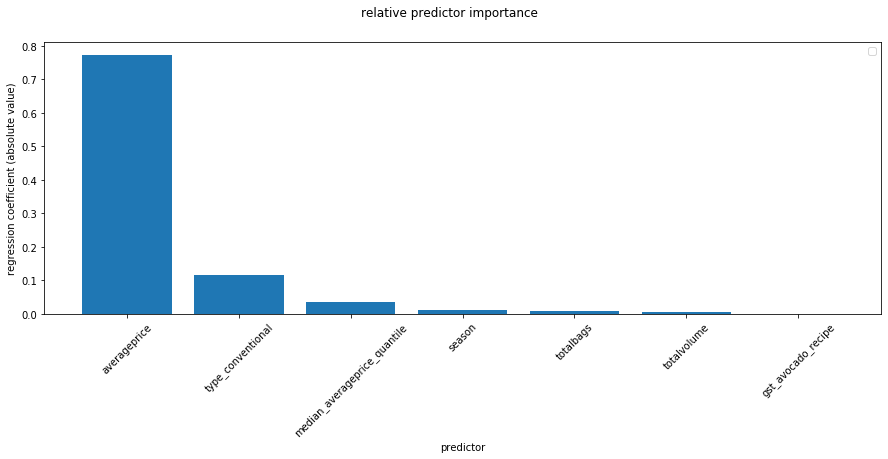

In [60]:
plt.figure(figsize = (15,5))
ax = plt.bar(predictor_coeff.predictor, predictor_coeff.abs_coeff)
plt.suptitle("relative predictor importance")
plt.ylabel('regression coefficient (absolute value)')
plt.xticks(rotation=45)
plt.xlabel('predictor')
plt.show()  

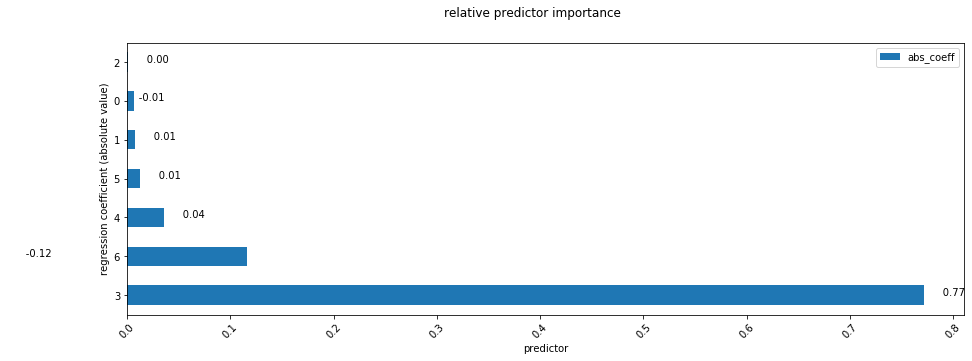

In [92]:
ax = predictor_coeff.loc[:, ['predictor', 'abs_coeff']].plot(kind='barh', figsize=(15,5))
[ax.text(v, i, '      {:.2f}'.format(v)) for i, v in enumerate(predictor_coeff.coeff)]
plt.suptitle("relative predictor importance")
plt.ylabel('regression coefficient (absolute value)')
plt.xticks(rotation=45)
plt.xlabel('predictor')
plt.show()  

### Multicollinearity in model features

                    totalvolume  totalbags  gst_avocado_recipe  averageprice
totalvolume            1.000000   0.957664            0.025793     -0.197596
totalbags              0.957664   1.000000            0.013908     -0.183310
gst_avocado_recipe     0.025793   0.013908            1.000000     -0.138188
averageprice          -0.197596  -0.183310           -0.138188      1.000000


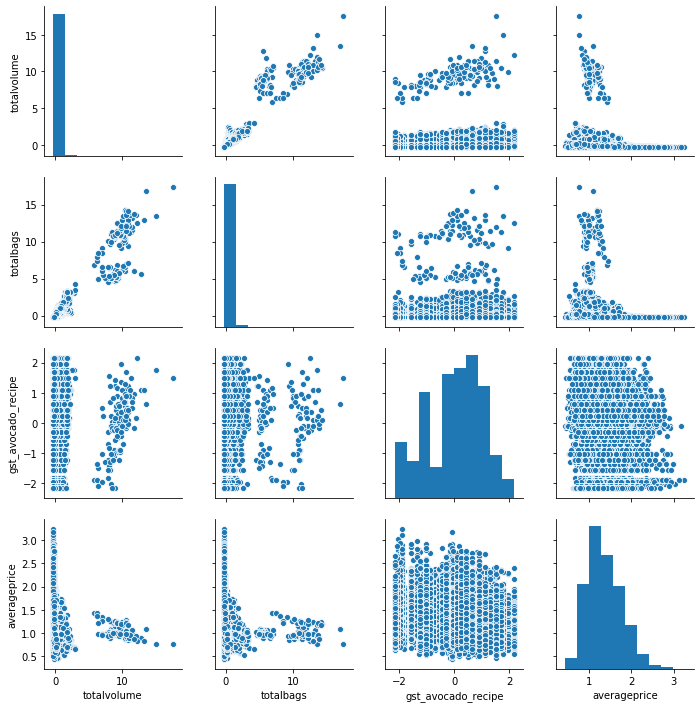

In [24]:
#subset numeric data
numeric_train_df = x_train_df.loc[:,['totalvolume', 'totalbags', 'gst_avocado_recipe', 'averageprice']]

#create the correlation matrix
corr = numeric_train_df.corr()
print(corr)

sns.pairplot(numeric_train_df)

`totalbags` and `totalvolume` are too highly correlated, remove one of them from next iteration.

### Distribution of model errors

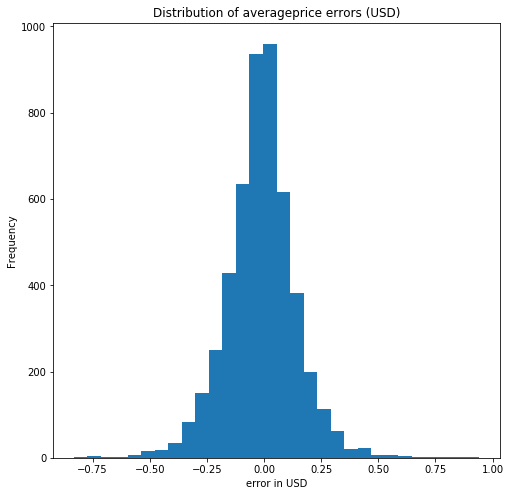

In [25]:
figs, axes = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
errors = pred_v_actual.predicted - pred_v_actual.actual
errors.plot(kind="hist", bins=30)
plt.title('Distribution of averageprice errors (USD)')
plt.xlabel('error in USD')

plt.show()

The errors are approximately normally distributed, meaning the model is low in bias.

### Visualizing predicted vs. actual

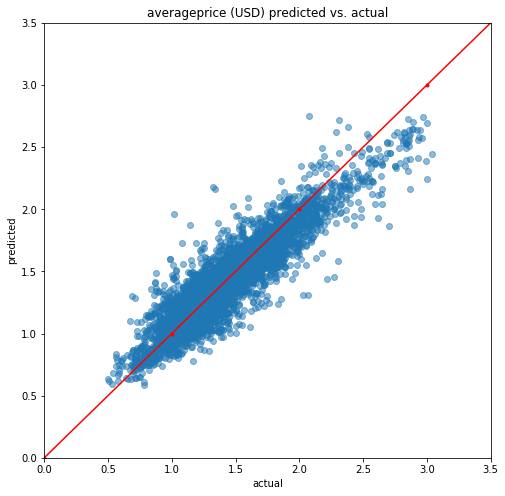

In [26]:
figs, axes = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))

plt.plot([0,1,2,3,4], [0,1,2,3,4], '.r-') 
plt.scatter(pred_v_actual.actual, pred_v_actual.predicted, alpha=0.5)
plt.title('averageprice (USD) predicted vs. actual')
plt.xlabel('actual')
plt.ylabel('predicted')
axes.set_xlim(0,3.5)
axes.set_ylim(0,3.5)

plt.show()

In [60]:
#grap some identifiers (keys) to add to the pred_v_actual df
x_validation_identifiers = x_validation_df.loc[:, ['median_averageprice_quantile', 'season', 'type_conventional']].copy()
x_validation_identifiers.reset_index(inplace=True)

#add those identifiers to the pred_v_actual df
pred_v_actual_concat = pd.concat([pred_v_actual, x_validation_identifiers], axis=1)

#set a multi-index
pred_v_actual_concat.set_index(['date'], inplace=True)

pred_v_actual_concat.head()

,actual,predicted,region,type,median_averageprice_quantile,season,type_conventional
date,,,,,,,
2017-08-13,1.52,1.497521,Albany,conventional,4.0,3.0,1.0
2017-08-13,1.90,1.961013,Albany,organic,4.0,3.0,0.0
2017-08-13,1.37,1.296209,Atlanta,conventional,2.0,3.0,1.0
2017-08-13,2.14,1.882499,Atlanta,organic,2.0,3.0,0.0
2017-08-13,1.48,1.451437,BaltimoreWashington,conventional,4.0,3.0,1.0


In [61]:
def graph_one_pred_actual(df, r, t):
    subset = df[
        (df.region == r) & \
        (df.type == t)
       ]


    plt.figure(figsize = (15,5))
    ax = subset.loc[:, 'predicted'].plot(label="predicted")
    ax = subset.loc[:, 'actual'].plot(label="actual")
    plt.suptitle("averageprice predicted vs. actual\nfor region = {}, type = {}".format(r,t))
    plt.xlabel('time')
    plt.ylabel('averageprice (USD)')
    plt.legend()
    plt.show()  

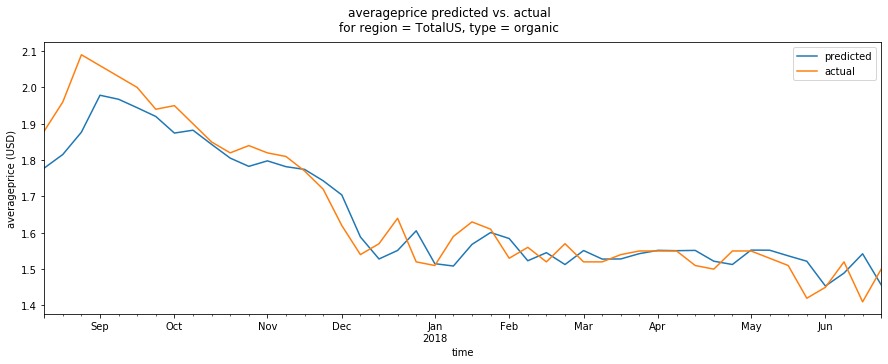

In [65]:
graph_one_pred_actual(pred_v_actual_concat, 
                  r = 'TotalUS', 
                  t = 'organic'
                 )

In [63]:
def graph_all_pred_actual(df):
    rs = set(df.region)
    ts = set(df.type)
    
    for r in rs:
        for t in ts:
            subset = df[
                (df.region == r) & \
                (df.type == t)
               ]


            plt.figure(figsize = (15,5))
            ax = subset.loc[:, 'predicted'].plot(label="predicted")
            ax = subset.loc[:, 'actual'].plot(label="actual")
            plt.suptitle("averageprice predicted vs. actual\nfor region = {}, type = {}".format(r,t))
            plt.xlabel('time')
            plt.ylabel('averageprice (USD)')
            plt.legend()
            plt.show()  

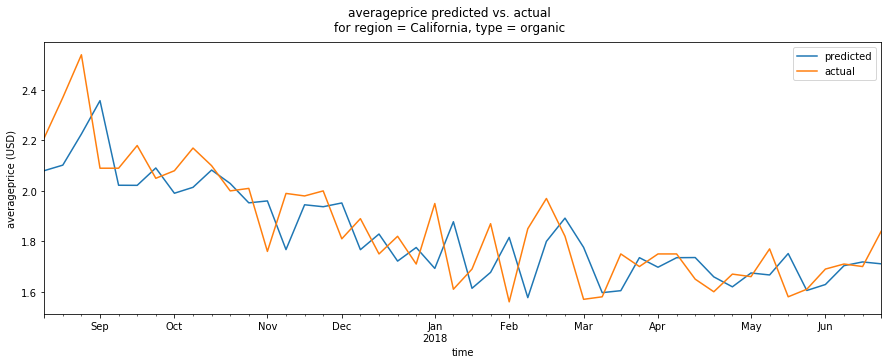

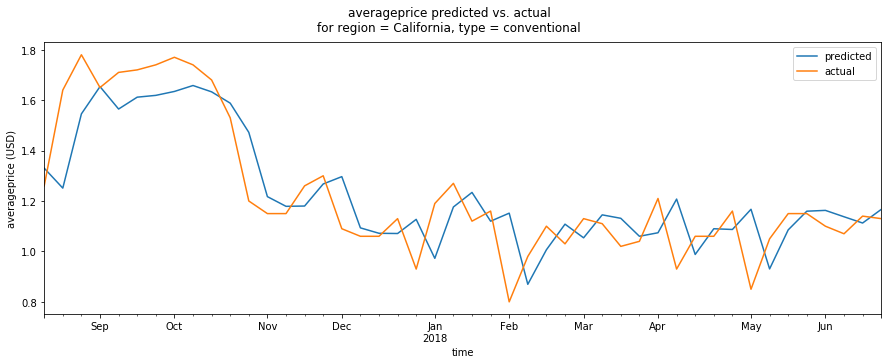

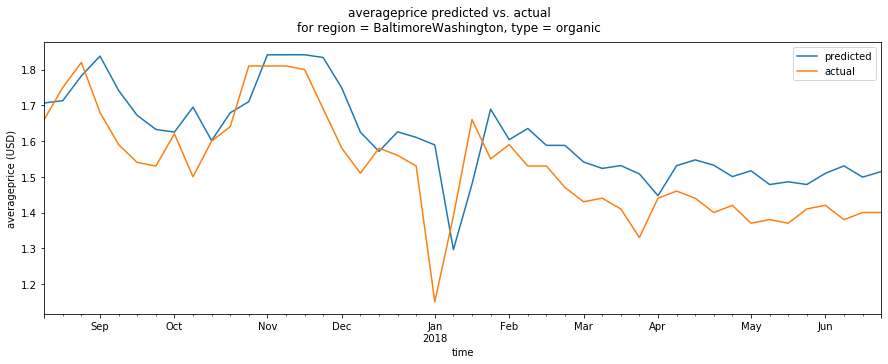

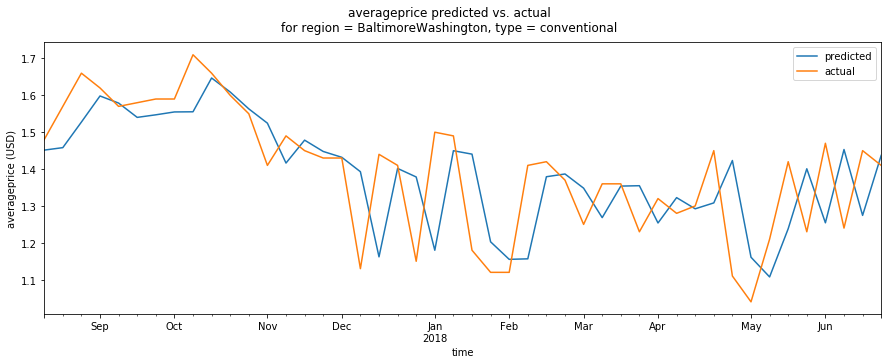

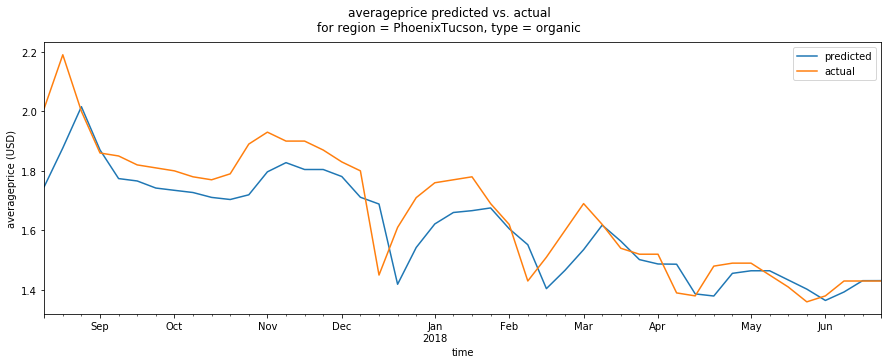

...

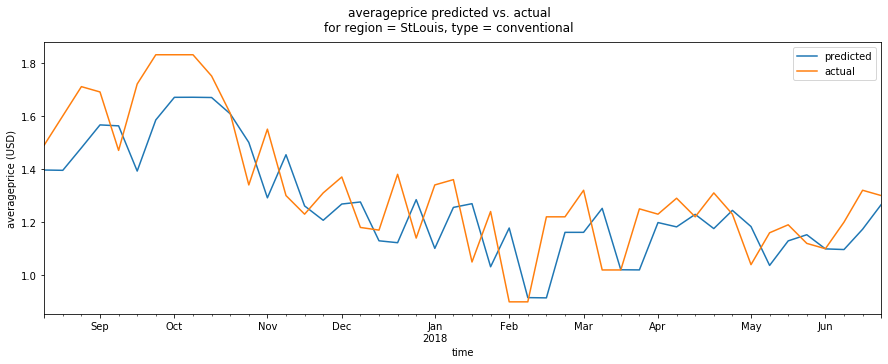

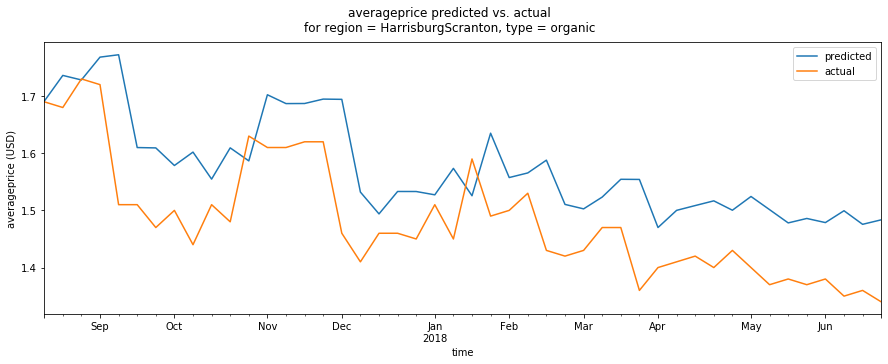

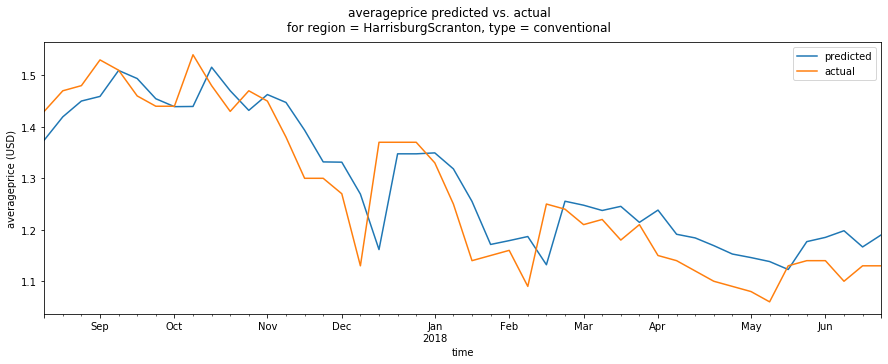

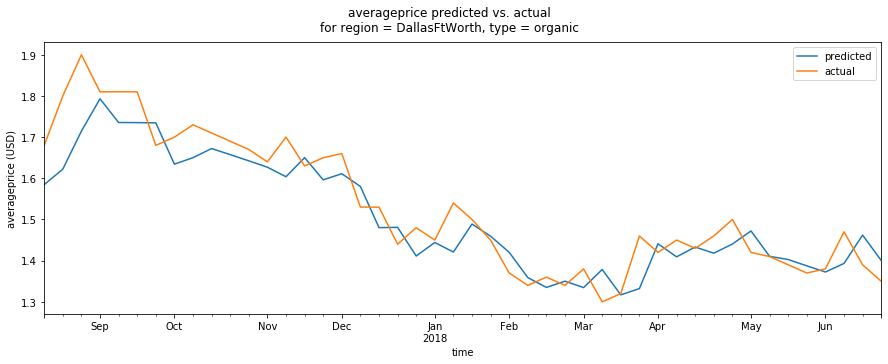

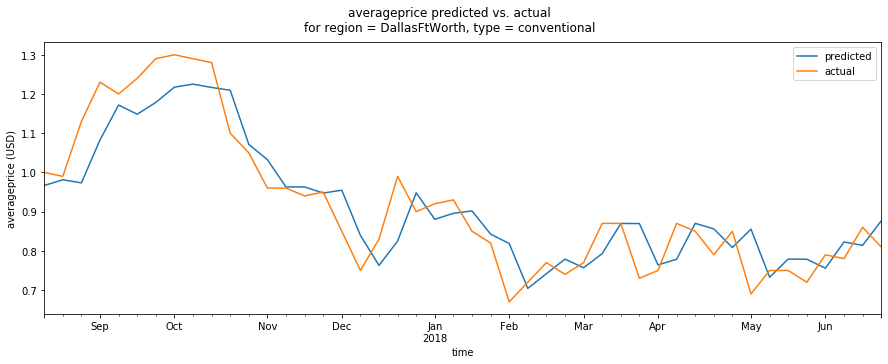

In [64]:
graph_all_pred_actual(pred_v_actual_concat)

## Modelling with Random Forest Regressor

### Parameter search
Next we will iterate over different sets of parameters for the Random Forest Regressor (RFR). For each parameter schema, we build our trees using bootstrapped samples and check the quality of the RFR using the out-of-bag score, which reports the coefficient of determination (see `find_RF_parameters()` documentation below). After all schemas have been scored, we compare these scores to see if they are significantly different using a one-way ANOVA. If the ANOVA result is satisfactory, we will choose the parameter schema which minimized our model evaluation metric, mean absolute error (MAE).

In [19]:
def find_RF_parameters(data, target,
                       my_criterion = 'mse',
                       n_estimators_range=range(10, 110, 20),
                       max_depth_range =range(4,15,1),
                       min_samples_split_range = range(2, 10, 1)
                      ):
    """
    Trains `n_estimators` sample models with bootstrapping 
    for each parameter schema, and reports the best 
    schema(s) with their average test-set accuracies (out-of 
    bag score).
    
    Note the `oob_score` (out-of bag score) has the following 
    meaning: In Breiman's original implementation of the random 
    forest algorithm, each tree is trained on about 2/3 of the 
    total training data. As the forest is built, each tree can 
    thus be tested (similar to leave one out cross validation) 
    on the samples not used in building that tree. This is the 
    out of bag error estimate - an internal error estimate of 
    a random forest as it is being constructed.
    
    From the scikit learn docs:
    A random forest is a meta estimator that fits a number of 
    decision tree classifiers on various sub-samples of the 
    dataset and uses averaging to improve the predictive 
    accuracy and control over-fitting. The sub-sample size is 
    always the same as the original input sample size but the 
    samples are drawn with replacement if bootstrap=True (default).
    """
    #prepare containers for results
    oob_scores = deque()
    counter = 0 
    results_cols = ['n_estimators', 'max_depth', 'min_samples_split', 'oob_score']
    n_schemas = len(n_estimators_range) * len(max_depth_range) * len(min_samples_split_range)
    results = np.zeros((n_schemas, len(results_cols)))

    #iterate over each parameter schema
    for n_estimators in n_estimators_range:
        for i_max_depth in max_depth_range:
            for i_min_samples_split in min_samples_split_range:
                #create the classifier object:
                RF = RandomForestRegressor(n_estimators      =    n_estimators, 
                                           criterion         =    my_criterion, 
                                           max_depth         =    i_max_depth,
                                           min_samples_split =    i_min_samples_split, 
                                           bootstrap         =    True, 
                                           max_samples       =    int(round(data.shape[0]/n_estimators, 0)), #use all datapoints
                                           oob_score         =    True
                                          )
                
                #fit n_estimators:
                RF.fit(data, target)

                #retrieve out-of-bag coefficient of determination
                oob_score = RF.oob_score_
                
                #record results:
                results[counter, :] = [n_estimators, i_max_depth, i_min_samples_split, oob_score]
                
                #add the mean accuracy to an array:
                oob_scores.append(oob_score)
                
                #add to counter
                counter += 1

    #convert deque to list
    oob_scores = np.array(oob_scores)
    #convert results array to df
    results_df = pd.DataFrame(results, columns=results_cols)                
    
    #find the optimal schema:
    optimal_indicies = np.where(abs(oob_scores) == abs(oob_scores).max())[0] # !!! min or max depends on evaluation metric !!!
    print("Optimal schema:")
    print(results_df.loc[optimal_indicies])
    
    #the least complex model will be the first:
    optimal_index = optimal_indicies[0]
    
    #compute the ANOVA F-value for all scores:
    print('\n')
    print('-------------------------------------------------------------------------------------')
    print('ANOVA F-value for the all the schema\'s out-of-bag coefficient of determination scores:')
    print('\t F = {}, p = {}'.format(round(stats.f_oneway(oob_scores).statistic, 3),
                                     round(stats.f_oneway(oob_scores).pvalue, 3)))
    print('-------------------------------------------------------------------------------------')
    
    return results_df, oob_scores, optimal_index    

### Parameter search with criterion `mae` (mean absolute error)

In [20]:
results_df, oob_scores, optimal_index = find_RF_parameters(x_train, y_train.ravel(), #make y 1D
                                                           my_criterion = 'mae',
                                                           n_estimators_range=[50,100,150],
                                                           max_depth_range =range(4,17,2),
                                                           min_samples_split_range = range(1000,10000,1000)
                                                          )

Optimal schema:
    n_estimators  max_depth  min_samples_split  oob_score
76         100.0        6.0             5000.0  -0.025073


-------------------------------------------------------------------------------------
ANOVA F-value for the all the schema's out-of-bag coefficient of determination scores:
	 F = nan, p = nan
-------------------------------------------------------------------------------------


C:\Users\rc\Anaconda3\lib\site-packages\scipy\stats\stats.py:3233: RuntimeWarning: invalid value encountered in double_scalars
  msb = ssbn / dfbn


In [21]:
RF = RandomForestRegressor(n_estimators=50, criterion='mae', max_depth=8, 
                            min_samples_split=7000)
RF.fit(x_train, y_train.ravel())
y_validation_pred = RF.predict(x_validation)

In [22]:
pred_v_actual = pd.DataFrame({'actual':y_validation.ravel(), 'predicted':y_validation_pred},columns=['actual','predicted'])
pred_v_actual.head()

,actual,predicted
0,1.52,1.6470
1,1.90,1.6470
2,1.37,1.3864
3,2.14,1.6470
4,1.48,1.6470


In [23]:
mean_absolute_error(pred_v_actual.actual, pred_v_actual.predicted)

0.1953957326892109

On average, we can predict `averageprice` with a margin of error of 20 cents.

In [24]:
median_absolute_error(pred_v_actual.actual, pred_v_actual.predicted)

0.1515999999999995

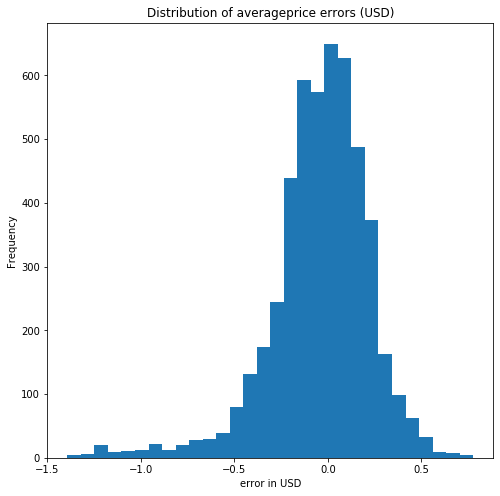

In [25]:
figs, axes = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
errors = pred_v_actual.predicted - pred_v_actual.actual
errors.plot(kind="hist", bins=30)
plt.title('Distribution of averageprice errors (USD)')
plt.xlabel('error in USD')

plt.show()

The errors are approximately normally distributed, meaning the model is low in bias.

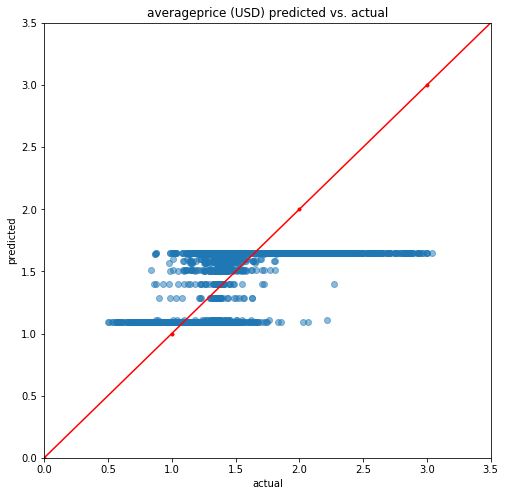

In [44]:
figs, axes = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))

plt.plot([0,1,2,3,4], [0,1,2,3,4], '.r-') 
plt.scatter(pred_v_actual.actual, pred_v_actual.predicted, alpha=0.5)
plt.title('averageprice (USD) predicted vs. actual')
plt.xlabel('actual')
plt.ylabel('predicted')
axes.set_xlim(0,3.5)
axes.set_ylim(0,3.5)

plt.show()

In [27]:
#grap some identifiers (keys) to add to the pred_v_actual df
x_validation_identifiers = x_validation_df.loc[:, ['median_averageprice_quantile', 'season', 'type_conventional']].copy()
x_validation_identifiers.reset_index(inplace=True)

#add those identifiers to the pred_v_actual df
pred_v_actual_concat = pd.concat([pred_v_actual, x_validation_identifiers], axis=1)

#set a multi-index
pred_v_actual_concat.set_index(['date'], inplace=True)

pred_v_actual_concat.head()

,actual,predicted,region,type,median_averageprice_quantile,season,type_conventional
date,,,,,,,
2017-08-13,1.52,1.6470,Albany,conventional,4.0,3.0,1.0
2017-08-13,1.90,1.6470,Albany,organic,4.0,3.0,0.0
2017-08-13,1.37,1.3864,Atlanta,conventional,2.0,3.0,1.0
2017-08-13,2.14,1.6470,Atlanta,organic,2.0,3.0,0.0
2017-08-13,1.48,1.6470,BaltimoreWashington,conventional,4.0,3.0,1.0


In [28]:
def graph_one_pred_actual(df, r, t):
    subset = df[
        (df.region == r) & \
        (df.type == t)
       ]


    plt.figure(figsize = (15,5))
    ax = subset.loc[:, 'predicted'].plot(label="predicted")
    ax = subset.loc[:, 'actual'].plot(label="actual")
    plt.suptitle("averageprice predicted vs. actual\nfor region = {}, type = {}".format(r,t))
    plt.xlabel('time')
    plt.ylabel('averageprice (USD)')
    plt.legend()
    plt.show()  

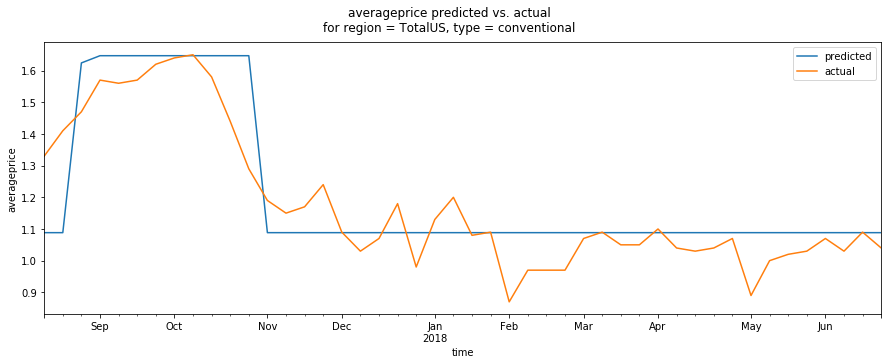

In [29]:
graph_one_pred_actual(pred_v_actual_concat, 
                  r = 'TotalUS', 
                  t = 'conventional'
                 )

In [30]:
def graph_all_pred_actual(df):
    rs = set(df.region)
    ts = set(df.type)
    
    for r in rs:
        for t in ts:
            subset = df[
                (df.region == r) & \
                (df.type == t)
               ]


            plt.figure(figsize = (15,5))
            ax = subset.loc[:, 'predicted'].plot(label="predicted")
            ax = subset.loc[:, 'actual'].plot(label="actual")
            plt.suptitle("averageprice predicted vs. actual\nfor region = {}, type = {}".format(r,t))
            plt.xlabel('time')
            plt.ylabel('averageprice (USD)')
            plt.legend()
            plt.show()  

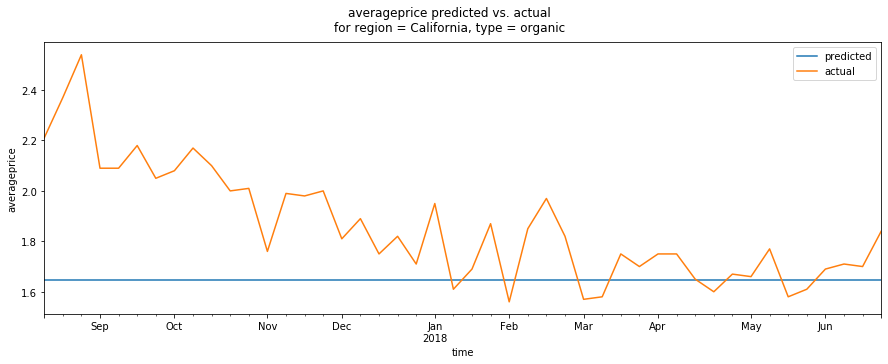

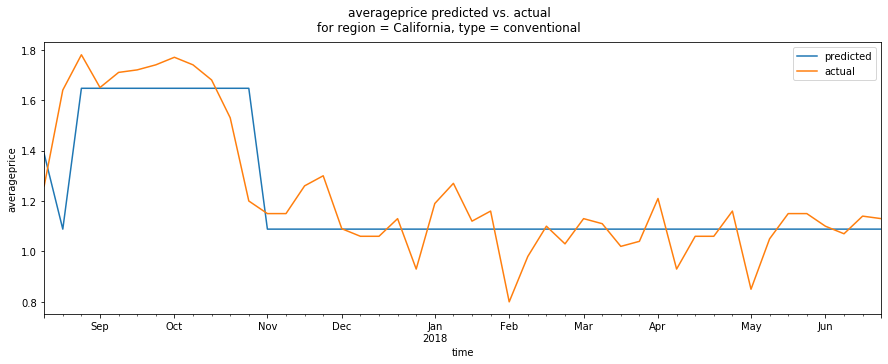

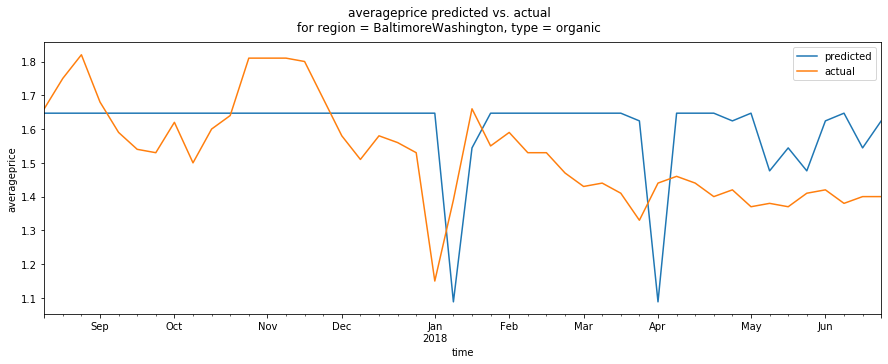

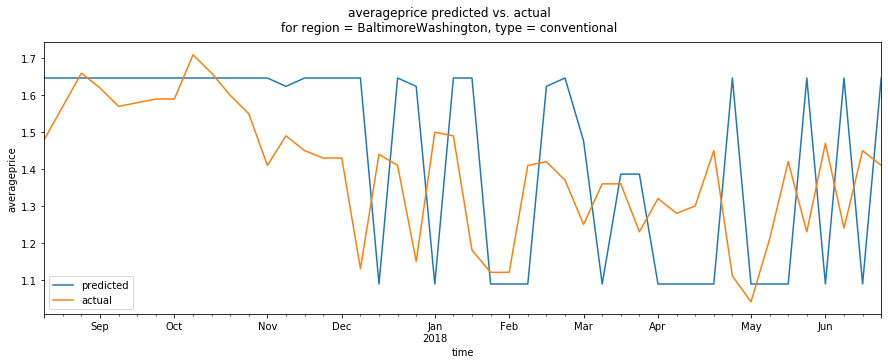

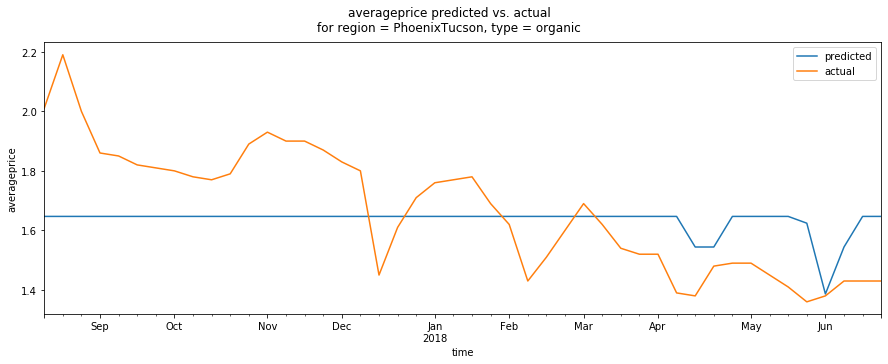

...

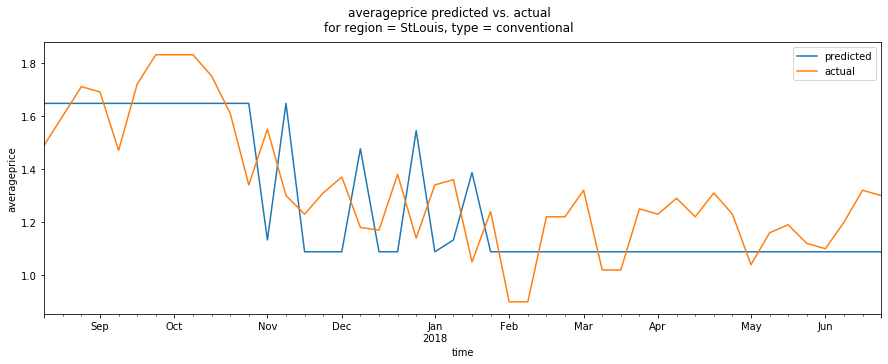

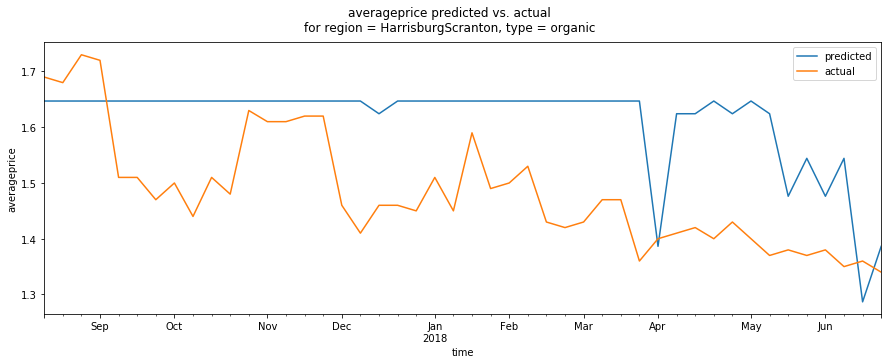

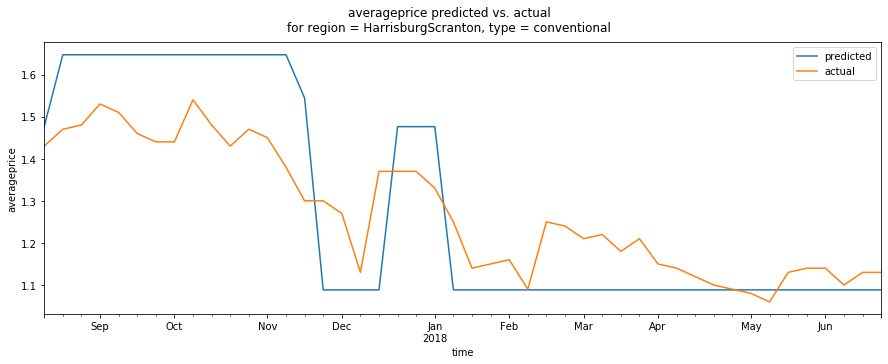

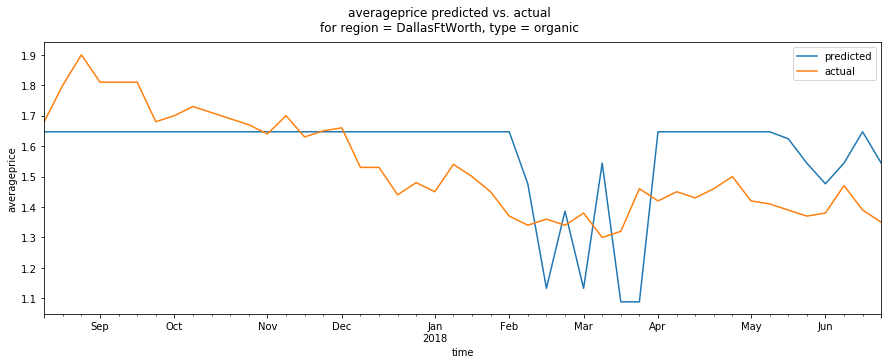

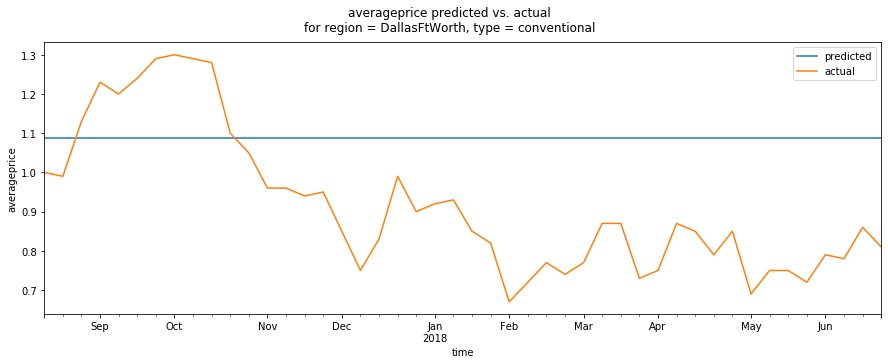

In [31]:
graph_all_pred_actual(pred_v_actual_concat)

#### Observations
It looks like these predictions are doing quite well, except that they either miss the spikes upwards or downward.

### Parameter search with criterion `mse` (mean squared error)

In [32]:
results_df, oob_scores, optimal_index = find_RF_parameters(x_train, y_train.ravel(), #make y 1D
                                                           my_criterion = 'mse',
                                                           n_estimators_range=[50,100,150],
                                                           max_depth_range =range(4,17,2),
                                                           min_samples_split_range = range(1000,10000,1000)
                                                          )

Optimal schema:
    n_estimators  max_depth  min_samples_split  oob_score
12          50.0        6.0             4000.0  -0.000747


-------------------------------------------------------------------------------------
ANOVA F-value for the all the schema's out-of-bag coefficient of determination scores:
	 F = nan, p = nan
-------------------------------------------------------------------------------------


C:\Users\rc\Anaconda3\lib\site-packages\scipy\stats\stats.py:3233: RuntimeWarning: invalid value encountered in double_scalars
  msb = ssbn / dfbn


In [33]:
RF = RandomForestRegressor(n_estimators=50, criterion='mae', max_depth=8, 
                            min_samples_split=7000)
RF.fit(x_train, y_train.ravel())
y_validation_pred = RF.predict(x_validation)

In [34]:
pred_v_actual = pd.DataFrame({'actual':y_validation.ravel(), 'predicted':y_validation_pred},columns=['actual','predicted'])
pred_v_actual.head()

,actual,predicted
0,1.52,1.6500
1,1.90,1.6500
2,1.37,1.4012
3,2.14,1.6500
4,1.48,1.6500


In [35]:
mean_absolute_error(pred_v_actual.actual, pred_v_actual.predicted)

0.19318168276972628

On average, we can predict `averageprice` with a margin of error of 20 cents.

In [36]:
median_absolute_error(pred_v_actual.actual, pred_v_actual.predicted)

0.14990000000000014

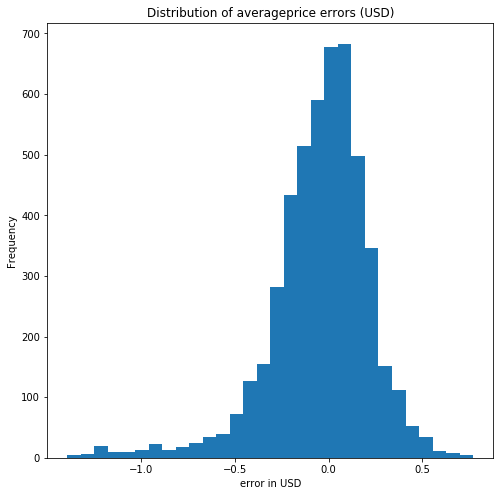

In [37]:
figs, axes = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
errors = pred_v_actual.predicted - pred_v_actual.actual
errors.plot(kind="hist", bins=30)
plt.title('Distribution of averageprice errors (USD)')
plt.xlabel('error in USD')

plt.show()

The errors are approximately normally distributed, meaning the model is low in bias.

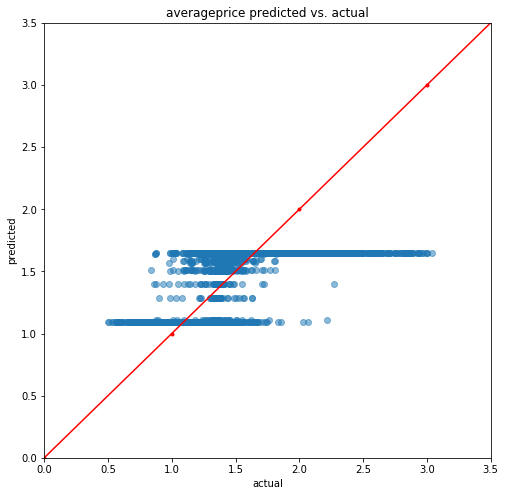

In [38]:
figs, axes = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))

plt.plot([0,1,2,3,4], [0,1,2,3,4], '.r-') 
plt.scatter(pred_v_actual.actual, pred_v_actual.predicted, alpha=0.5)
plt.title('averageprice (USD) predicted vs. actual')
plt.xlabel('actual')
plt.ylabel('predicted')
axes.set_xlim(0,3.5)
axes.set_ylim(0,3.5)

plt.show()

In [39]:
#grap some identifiers (keys) to add to the pred_v_actual df
x_validation_identifiers = x_validation_df.loc[:, ['median_averageprice_quantile', 'season', 'type_conventional']].copy()
x_validation_identifiers.reset_index(inplace=True)

#add those identifiers to the pred_v_actual df
pred_v_actual_concat = pd.concat([pred_v_actual, x_validation_identifiers], axis=1)

#set a multi-index
pred_v_actual_concat.set_index(['date'], inplace=True)

pred_v_actual_concat.head()

,actual,predicted,region,type,median_averageprice_quantile,season,type_conventional
date,,,,,,,
2017-08-13,1.52,1.6500,Albany,conventional,4.0,3.0,1.0
2017-08-13,1.90,1.6500,Albany,organic,4.0,3.0,0.0
2017-08-13,1.37,1.4012,Atlanta,conventional,2.0,3.0,1.0
2017-08-13,2.14,1.6500,Atlanta,organic,2.0,3.0,0.0
2017-08-13,1.48,1.6500,BaltimoreWashington,conventional,4.0,3.0,1.0


In [45]:
def graph_one_pred_actual(df, r, t):
    subset = df[
        (df.region == r) & \
        (df.type == t)
       ]


    plt.figure(figsize = (15,5))
    ax = subset.loc[:, 'predicted'].plot(label="predicted")
    ax = subset.loc[:, 'actual'].plot(label="actual")
    plt.suptitle("averageprice predicted vs. actual\nfor region = {}, type = {}".format(r,t))
    plt.xlabel('time')
    plt.ylabel('averageprice (USD)')
    plt.legend()
    plt.show()  

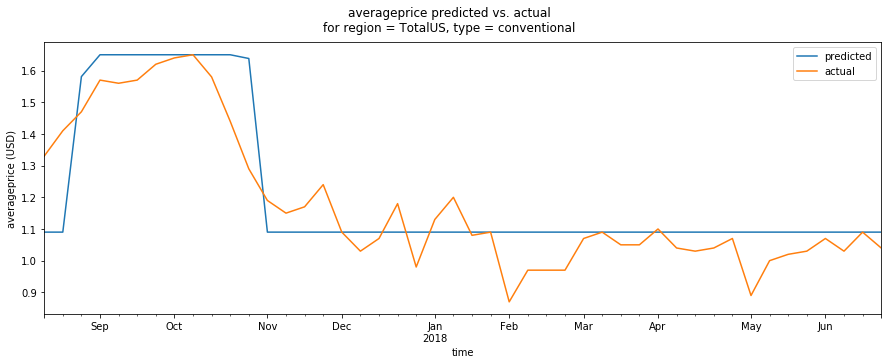

In [46]:
graph_one_pred_actual(pred_v_actual_concat, 
                  r = 'TotalUS', 
                  t = 'conventional'
                 )

In [47]:
def graph_all_pred_actual(df):
    rs = set(df.region)
    ts = set(df.type)
    
    for r in rs:
        for t in ts:
            subset = df[
                (df.region == r) & \
                (df.type == t)
               ]


            plt.figure(figsize = (15,5))
            ax = subset.loc[:, 'predicted'].plot(label="predicted")
            ax = subset.loc[:, 'actual'].plot(label="actual")
            plt.suptitle("averageprice predicted vs. actual\nfor region = {}, type = {}".format(r,t))
            plt.xlabel('time')
            plt.ylabel('averageprice (USD)')
            plt.legend()
            plt.show()  

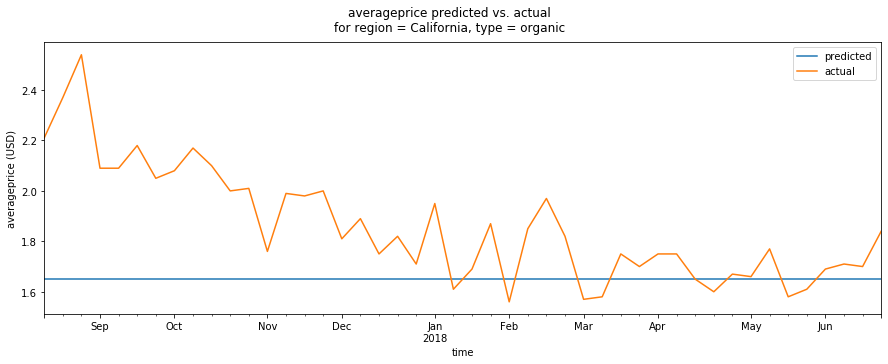

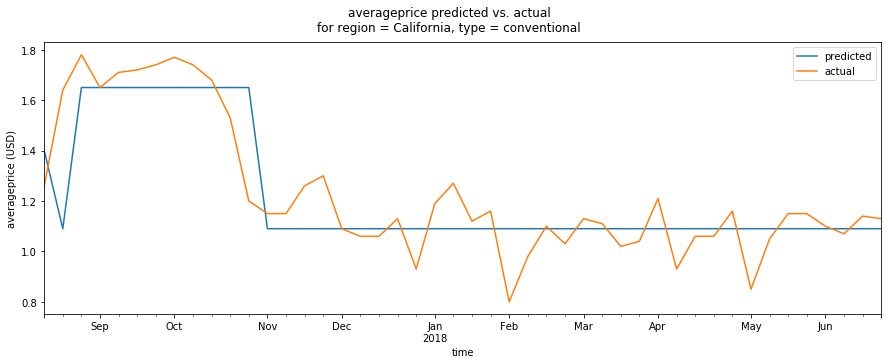

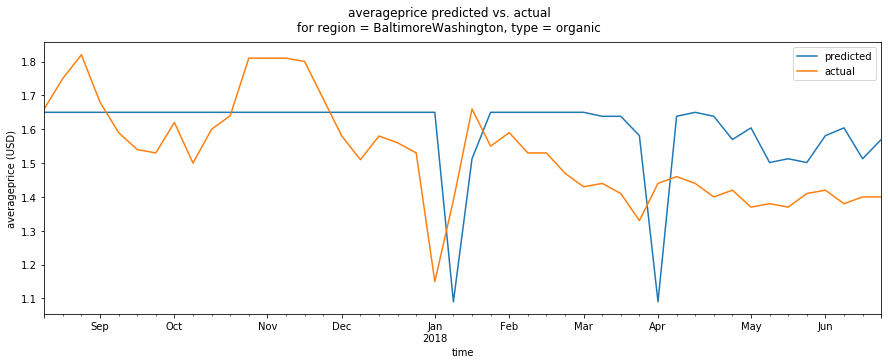

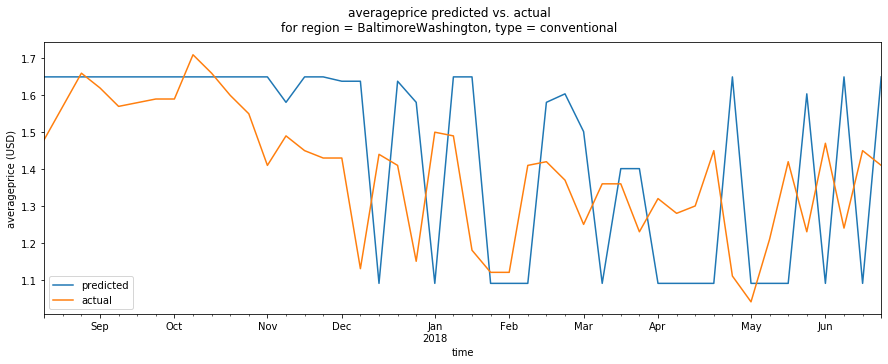

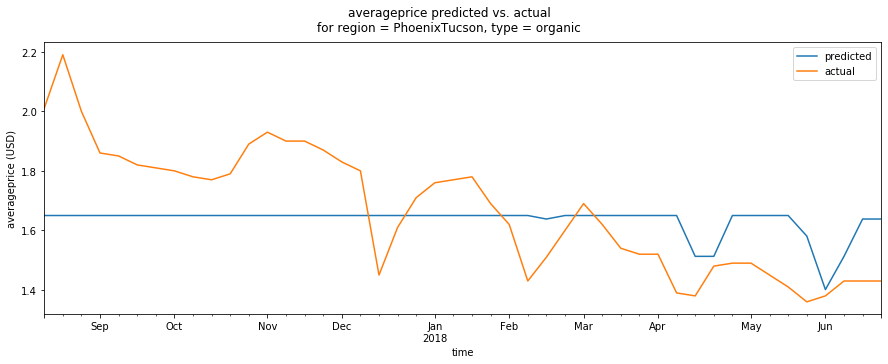

...

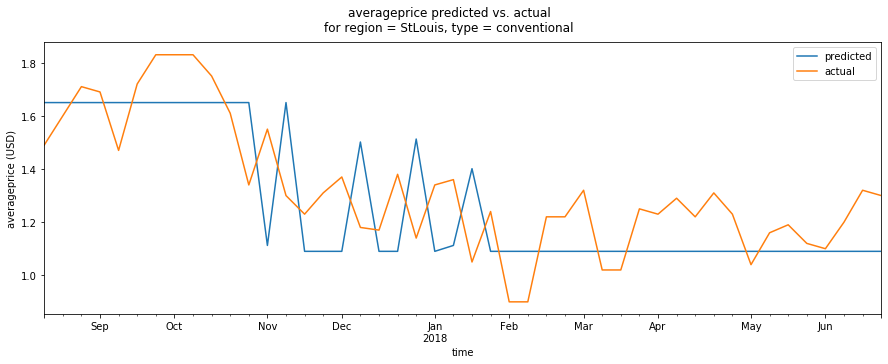

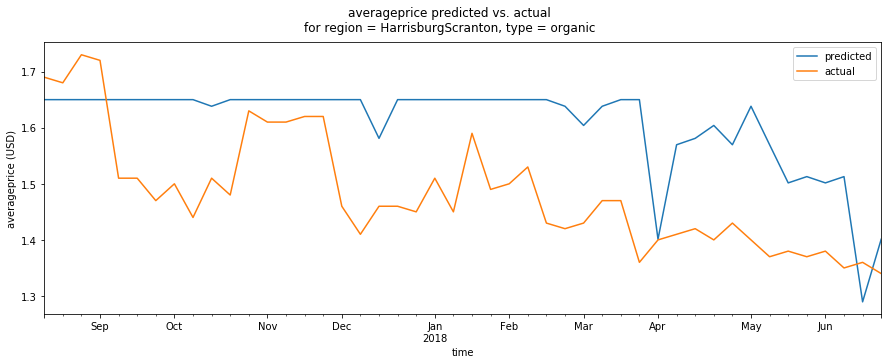

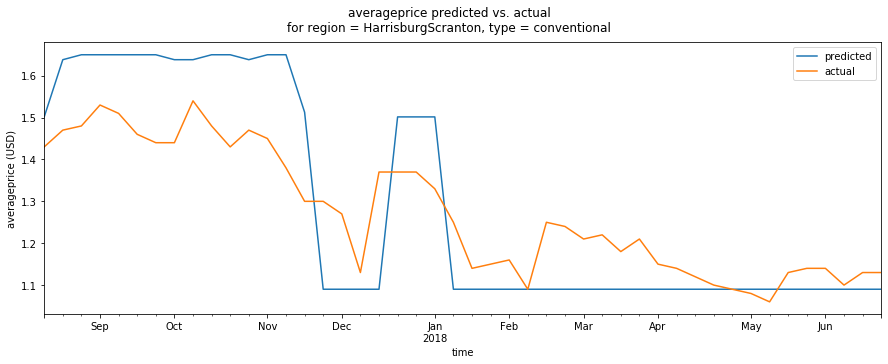

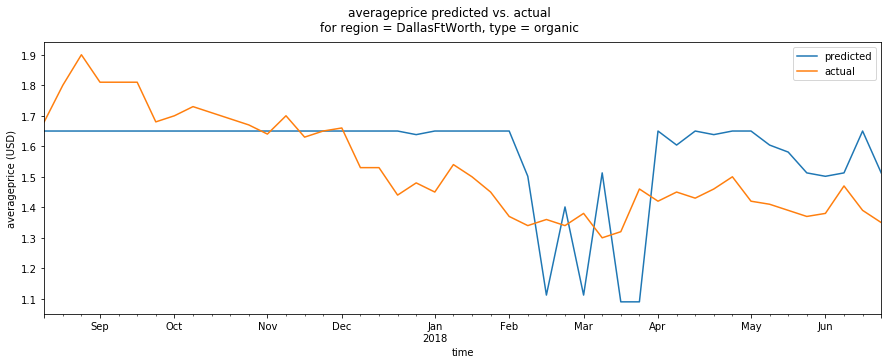

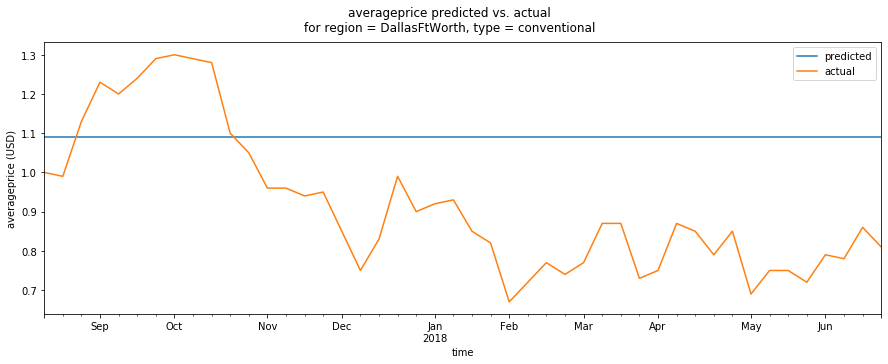

In [48]:
graph_all_pred_actual(pred_v_actual_concat)